# Tests using Detectron2 Mask RCNN 
# & COCO Weights 
# & Custom dataset

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Overview :
 * Test a pretrained model on random image
 * Build custom dataset
 * Train on our custom dataset starting from pretrained weights on COCO dataset
 * Test our new model


Links:
* https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/
* https://github.com/facebookresearch/detectron2
* https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5
* https://detectron2.readthedocs.io/en/latest/tutorials/getting_started.html



# Install detectron2

In [ ]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 14.8 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=69df8da556bfbdd5562e4f52e4c08592f34b50b0c75aa9caf6d4d03391860a92
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
torch:  1.12 ; cuda:  cu113
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Run a pre-trained detectron2 model (can skip)

We first download an image from the COCO dataset:

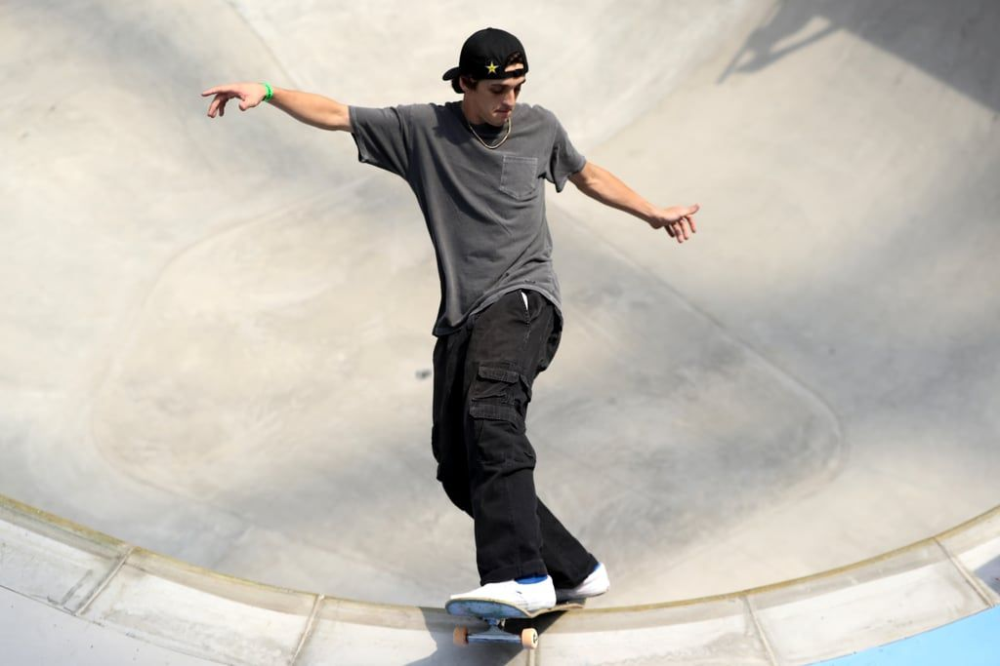

In [ ]:
#!wget http://images.cocodataset.org/val2017/000000439715.jpg -q -O input.jpg
!wget https://imgs.search.brave.com/2McgJONdwYtxjV1FIgkpMo0o5ww_MaLZxLOI_tMH7kI/rs:fit:1024:683:1/g:ce/aHR0cHM6Ly9tZWRp/YTEucG9wc3VnYXIt/YXNzZXRzLmNvbS9m/aWxlcy90aHVtYm9y/L1ZMNkFHNy1Zc0dy/UXhTUjlmOTRHUmJG/d0o5ay9maXQtaW4v/MTAyNHgxMDI0L2Zp/bHRlcnM6Zm9ybWF0/X2F1dG8tISEtOnN0/cmlwX2ljYy0hIS0v/MjAyMS8wNi8yMy82/NzIvbi8xOTIyNzI5/LzNiNGMyZWE0Zjgw/MGFjMmFfR2V0dHlJ/bWFnZXMtMTE2NjEw/NjYyOS9pL0Nvcnkt/SnVuZWF1LmpwZw -q -O input3.jpg
#!wget https://imgs.search.brave.com/EYtg4wKmNr83ftlxs-bwOjP07QQVxexdNecV9nzDTCc/rs:fit:1200:1080:1/g:ce/aHR0cDovL3d3dy5z/eWRuZXlvbHltcGlj/cGFyay5jb20uYXUv/LS9tZWRpYS9pbWFn/ZXMvc29wYS9zeWRu/ZXktb2x5bXBpYy1w/YXJrLXNpdGUvcGFy/a3MvaGVyby1pbWFn/ZS8yMDA5LXRoZS10/cmVpbGxhZ2UuanBn -q -O input2.jpg
im = cv2.imread("./input3.jpg")
cv2_imshow(im)

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [ ]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_a3ec72.pkl: 254MB [00:12, 20.3MB/s]                           
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([ 0, 36], device='cuda:0')
Boxes(tensor([[202.0189,  32.2519, 722.4236, 629.7983],
        [457.9734, 613.7614, 600.2469, 667.1288]], device='cuda:0'))


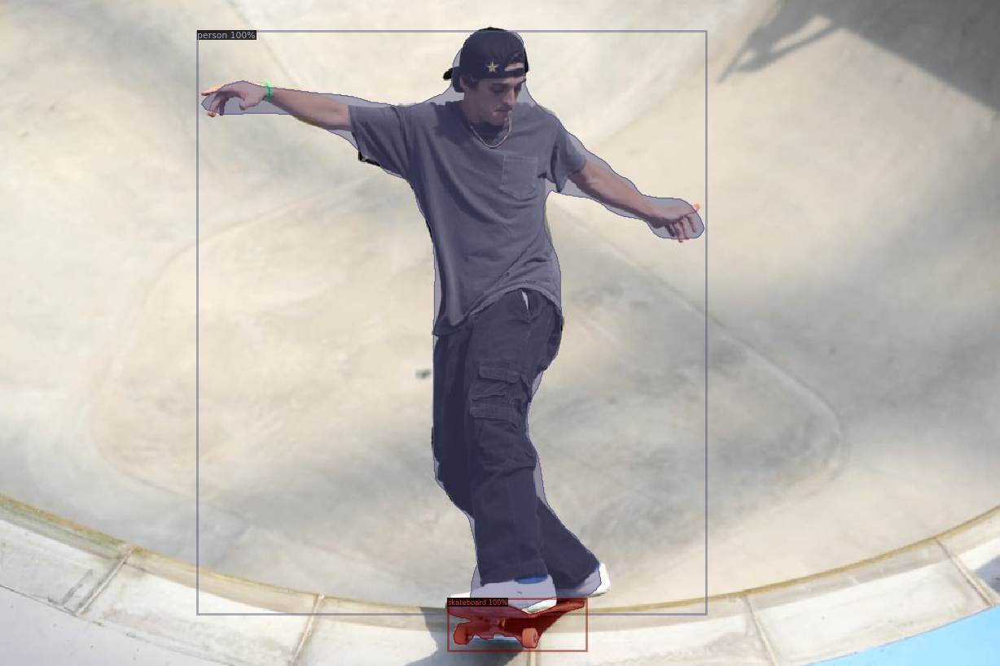

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Train on a custom dataset

I built this tiny dataset from images found online and the following annotation tool :  
https://www.robots.ox.ac.uk/~vgg/software/via/via.html

Also used https://image.online-convert.com/fr/convertir/webp-en-jpg to convert to some images to jpg

Structure :    
```
skaters
|-train
  | <imgs>
  | via_project_data.json
|-val
  | <imgs>
  | via_project_data.json
```
Might also need to change the code below if there are some differences..

## Prepare the dataset

In [ ]:
# When updating data 
#!rm -r skaters
#!rm skaters.zip

In [ ]:
# Unzip data
!unzip skaters.zip

In [ ]:
generalClasses = ['Top','Bottom','Shoe','Skateboard', 'Bag', 'Hat', 'Others']
classMap = {
  'shirt':'Top',
  't-shirt':'Top',
  'sweater':'Top',
  'jersey':'Top',
  'dress':'Top',
  'coat':'Top',
  'top':'Top',
  'shirt':'Top',
  'trousers':'Bottom',
  'shorts':'Bottom',
  'short':'Bottom',
  'skirt':'Bottom',
  'shoe': 'Shoe',
  'underpants':'Others',
  'sock': 'Others',
  'skateboard':'Skateboard',
  'backpack':'Bag',
  'bag':'Bag',
  'hat':'Hat',
  'helmet':'Hat',
  'watch':'Others',
  'bracelet': 'Others',
  'glasses':'Others',
  'belt': 'Others',
  'glove':'Others',
  'mask': 'Others',
  }

Register the skaters dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [ ]:
def exploreDataset(filepath, jsonTrain, jsonVal):
    statsC = {}
    statsA = {}
    json_file = os.path.join(filepath, jsonTrain)
    with open(json_file) as f:
      dt = json.load(f)
      for file in dt.keys():
        for anno in dt[file]["regions"]:
          if 'color' in anno['region_attributes']:
            if anno['region_attributes']['color'] in statsA:
              statsA[anno['region_attributes']['color']] += 1
            else:
              statsA[anno['region_attributes']['color']] = 1
          if 'type' in anno['region_attributes']:
            if anno['region_attributes']['type'] in statsC:
              statsC[anno['region_attributes']['type']] += 1
            else:
              statsC[anno['region_attributes']['type']] = 1

    json_file = os.path.join(filepath, jsonVal)
    with open(json_file) as f:
      dt = json.load(f)
      for file in dt.keys():
        for anno in dt[file]["regions"]:
          if 'color' in anno['region_attributes']:
            if anno['region_attributes']['color'] in statsA:
              statsA[anno['region_attributes']['color']] += 1
            else:
              statsA[anno['region_attributes']['color']] = 1
          if 'type' in anno['region_attributes']:
            if anno['region_attributes']['type'] in statsC:
              statsC[anno['region_attributes']['type']] += 1
            else:
              statsC[anno['region_attributes']['type']] = 1

    statsC = dict(sorted(statsC.items(), key=lambda item: item[1], reverse = True))
    statsA = dict(sorted(statsA.items(), key=lambda item: item[1], reverse = True))
    
    return (statsC, statsA)

In [ ]:
dt = exploreDataset("skaters/","via_project_data_train.json","via_project_data_val.json")

print("''' Classes '''\nTotal : "+str(sum(dt[0].values()))+"\n")
for x in dt[0].keys():
  if x not in classMap:
    print(x + str("not in classMap"))
  else:
    print(x + "  " + str(dt[0][x]))
myClasses = list(dt[0].keys())

print("\n\n''' Attributes '''\nTotal : "+str(sum(dt[1].values()))+"\n")
for x in dt[1].keys():
  print(x + "  " + str(dt[1][x]))
myAttributes = list(dt[1].keys())

''' Classes '''
Total : 684

shoe  169
trousers  109
skateboard  92
t-shirt  59
hat  52
sock  50
shirt  33
sweater  28
jersey  19
shorts  12
glasses  9
top  8
bracelet  7
belt  7
helmet  4
short  4
coat  4
backpack  3
underpants  3
skirt  3
dress  3
watch  2
glove  2
bag  1
mask  1


''' Attributes '''
Total : 670

black  286
white  161
blue  58
red  36
green  26
grey  25
brown  22
beige  20
orange  13
purple  8
yellow  7
pink  5
cyan  3


bonnet -> 'beanies'

casquette -> 'cap'

'short' -> 'shorts'

In [ ]:
datasetTrain = "SkatersTrain"
datasetTest = "SkatersTest"

In [ ]:
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode


def get_skaters_dicts(img_dir, is_train):
    json_file = os.path.join(img_dir, "via_project_data_"+("train" if is_train else "val")+".json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir+("train/" if is_train else "val/"), v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        #print(annos)
        objs = []
        for anno in annos:
            #print(anno)
            catIndex = myClasses.index(anno["region_attributes"]["type"])
            # next line for general classes, comment if you want maximum class details
            catIndex = generalClasses.index(classMap[anno["region_attributes"]["type"]])
            if "color" in anno["region_attributes"]:
              attrIndex = myAttributes.index(anno["region_attributes"]["color"])
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": catIndex,
                "attribute_id": attrIndex
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [ ]:
for d in ["train", "val"]:
    DatasetCatalog.register("skaters_" + d, lambda d=d: get_skaters_dicts("skaters/",  d=="train"))
    #MetadataCatalog.get("skaters_" + d).set(thing_classes=myClasses)
    MetadataCatalog.get("skaters_" + d).set(thing_classes=generalClasses)

skaters_metadata = MetadataCatalog.get("skaters_train")

In [ ]:
## if needed
#for d in ["train", "val"]:
  #DatasetCatalog.remove("skaters_" + d)
  #MetadataCatalog.remove("skaters_" + d)

In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode
'''

def get_skaters_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_project_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        print(annos)
        objs = []
        for anno in annos:
            #print(anno)
            cat = anno["region_attributes"]["type"]
            catIndex = myClasses.index(cat)
            #print(catIndex)
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": catIndex,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

'''

for d in ["train", "val"]:
    DatasetCatalog.register("skaters_" + d, lambda d=d: get_skaters_dicts("skaters/", d=="train"))
    MetadataCatalog.get("skaters_" + d).set(thing_classes=myClasses)
skaters_metadata = MetadataCatalog.get("skaters_train")

AssertionError: ignored

To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



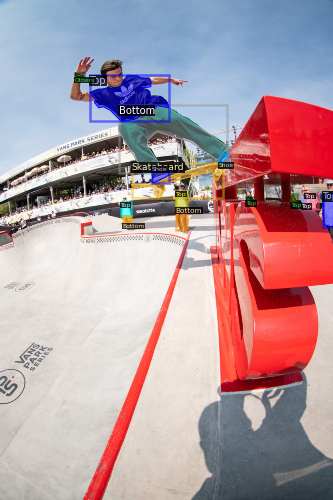

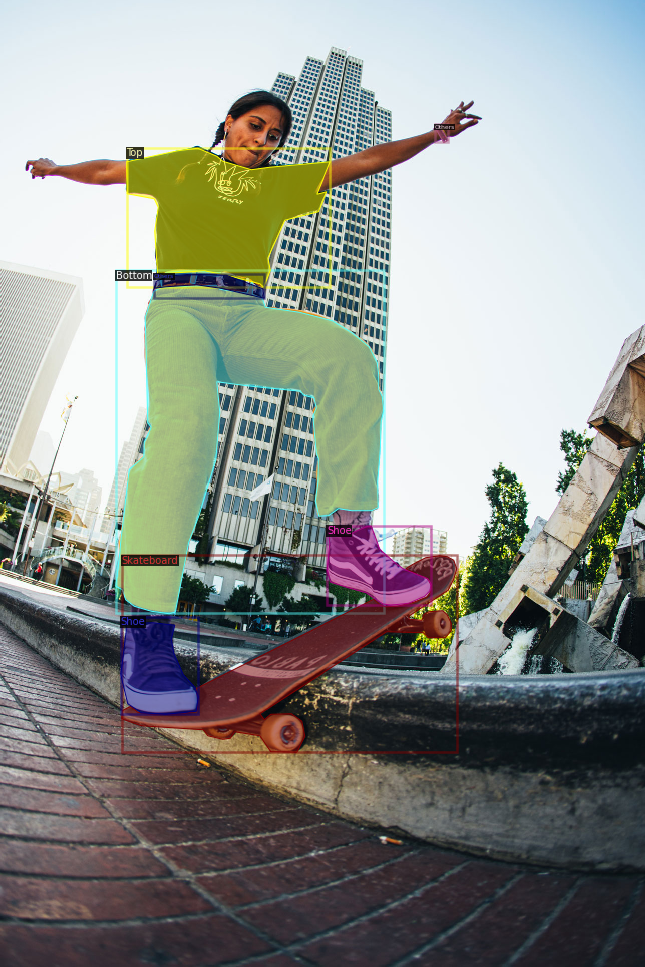

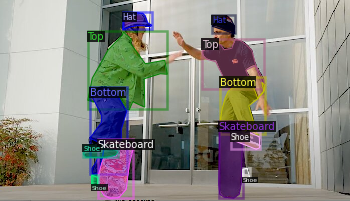

In [ ]:
dataset_dicts = get_skaters_dicts("skaters/", True)
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=skaters_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("skaters_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.0005  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(generalClasses) #len(myClasses)  # many classes (-1 because background should apparently not be counted). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[08/30 12:46:02 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[08/30 12:46:03 d2.engine.train_loop]: Starting training from iteration 0
[08/30 12:46:34 d2.utils.events]:  eta: 0:36:56  iter: 19  total_loss: 4.566  loss_cls: 2.116  loss_box_reg: 0.7721  loss_mask: 0.6948  loss_rpn_cls: 0.7793  loss_rpn_loc: 0.2319  time: 1.5019  data_time: 0.1111  lr: 9.9905e-06  max_mem: 7127M
[08/30 12:47:05 d2.utils.events]:  eta: 0:37:52  iter: 39  total_loss: 4.329  loss_cls: 1.986  loss_box_reg: 0.7817  loss_mask: 0.6912  loss_rpn_cls: 0.618  loss_rpn_loc: 0.2208  time: 1.5315  data_time: 0.0690  lr: 1.998e-05  max_mem: 7127M
[08/30 12:47:38 d2.utils.events]:  eta: 0:38:16  iter: 59  total_loss: 3.891  loss_cls: 1.68  loss_box_reg: 0.8227  loss_mask: 0.6828  loss_rpn_cls: 0.3916  loss_rpn_loc: 0.2181  time: 1.5593  data_time: 0.0485  lr: 2.997e-05  max_mem: 7127M
[08/30 12:48:09 d2.utils.events]:  eta: 0:37:42  iter: 79  total_loss: 3.261  loss_cls: 1.358  loss_box_reg: 0.8327  loss_mask: 0.6748  loss_rpn_cls: 0.2402  loss_rpn_loc: 0.1839  time: 1.5609  data

In [ ]:
# Look at training curves in tensorboard:
# never managed to make this work
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold (default was 0.7)
predictor = DefaultPredictor(cfg)

[08/30 13:30:24 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

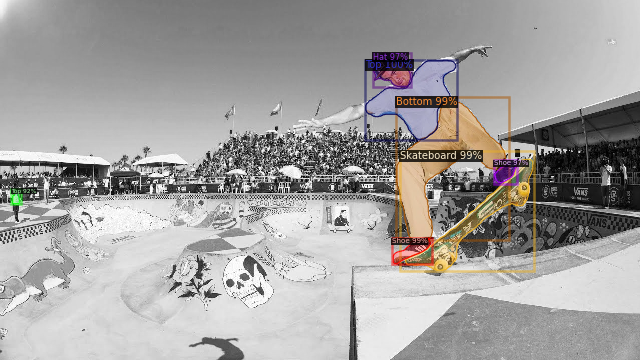

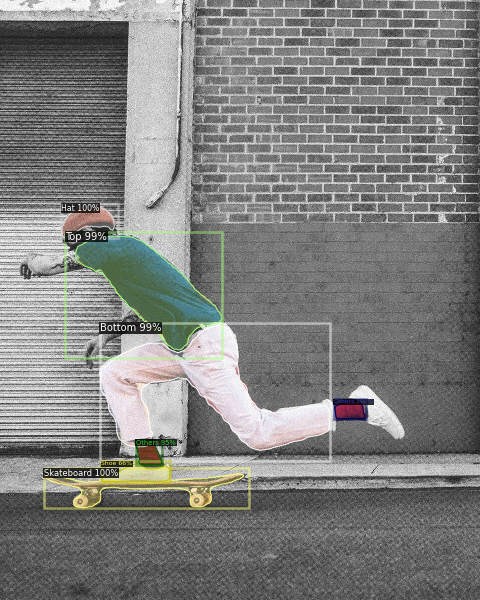

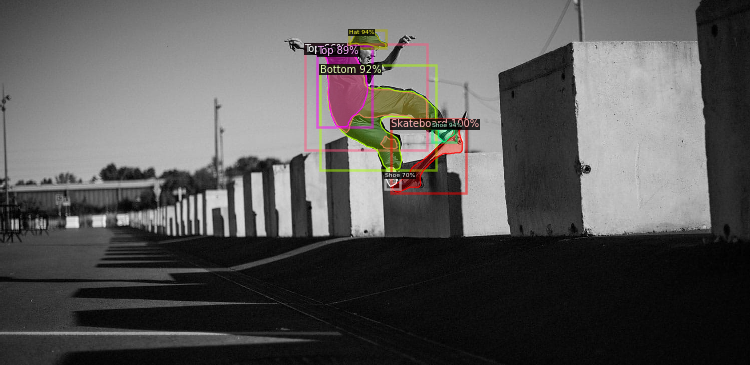

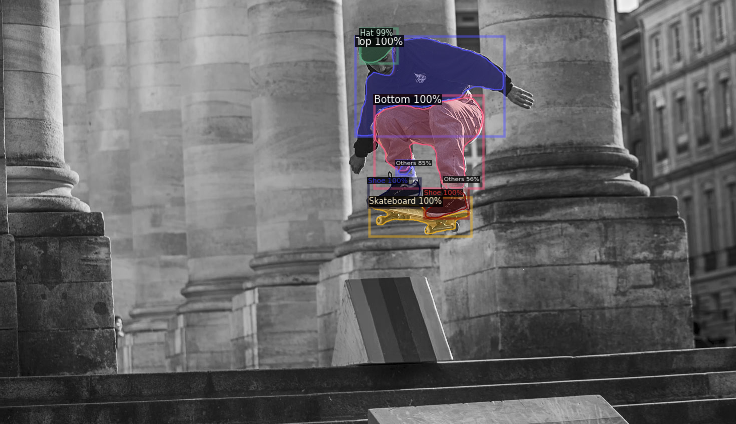

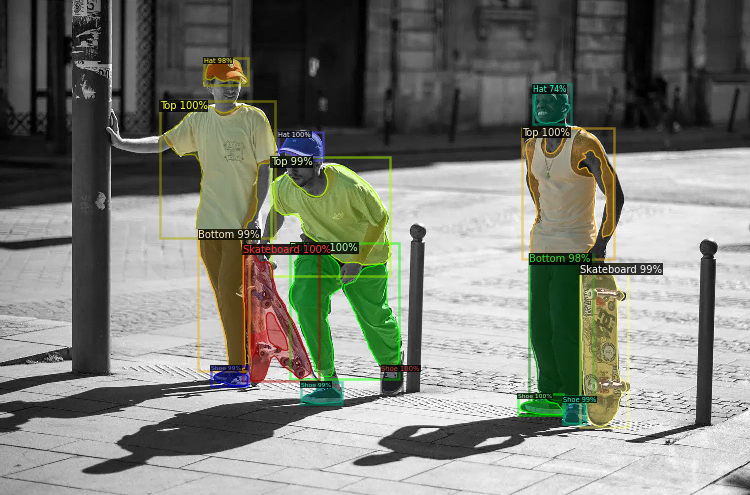

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_skaters_dicts("skaters/", False)
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=skaters_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("skaters_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "skaters_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/30 13:30:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/30 13:30:44 d2.data.common]: Serializing 10 elements to byte tensors and concatenating them all ...
[08/30 13:30:44 d2.data.common]: Serialized dataset takes 0.05 MiB
[08/30 13:30:44 d2.evaluation.evaluator]: Start inference on 10 batches
[08/30 13:30:46 d2.evaluation.evaluator]: Total inference time: 0:00:01.014230 (0.202846 s / iter per device, on 1 devices)
[08/30 13:30:46 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.153604 s / iter per device, on 1 devices)
[08/30 13:30:46 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/30 13:30:46 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/30 13:30:46 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DON

## Saved results

With All classes, 2 ipb, 300 iter, lr 0.00025

OrderedDict([('bbox', {'AP': 4.363170822576763, 'AP50': 7.658842807357659, 'AP75': 4.505250525052506, 'APs': 0.0, 'APm': 8.060139347268061, 'APl': 14.648802975535649, 'AP-shoe': 7.590759075907591, 'AP-trousers': 12.769448373408771, 'AP-skateboard': 45.08735488933509, 'AP-t-shirt': 0.0, 'AP-hat': 0.0, 'AP-sock': 0.0, 'AP-shirt': 0.0, 'AP-sweater': 0.0, 'AP-jersey': 0.0, 'AP-shorts': 0.0, 'AP-glasses': nan, 'AP-top': 0.0, 'AP-bracelet': 0.0, 'AP-belt': 0.0, 'AP-helmet': nan, 'AP-short': 0.0, 'AP-coat': nan, 'AP-backpack': nan, 'AP-underpants': 0.0, 'AP-skirt': nan, 'AP-dress': nan, 'AP-watch': nan, 'AP-glove': nan, 'AP-bag': nan, 'AP-mask': nan}), ('segm', {'AP': 2.4200162873430195, 'AP50': 6.107610761076108, 'AP75': 1.0985384252710986, 'APs': 0.0, 'APm': 3.5258525852585256, 'APl': 11.541961338991042, 'AP-shoe': 6.221122112211221, 'AP-trousers': 13.234323432343237, 'AP-skateboard': 16.844798765590845, 'AP-t-shirt': 0.0, 'AP-hat': 0.0, 'AP-sock': 0.0, 'AP-shirt': 0.0, 'AP-sweater': 0.0, 'AP-jersey': 0.0, 'AP-shorts': 0.0, 'AP-glasses': nan, 'AP-top': 0.0, 'AP-bracelet': 0.0, 'AP-belt': 0.0, 'AP-helmet': nan, 'AP-short': 0.0, 'AP-coat': nan, 'AP-backpack': nan, 'AP-underpants': 0.0, 'AP-skirt': nan, 'AP-dress': nan, 'AP-watch': nan, 'AP-glove': nan, 'AP-bag': nan, 'AP-mask': nan})])

With some general classes, 2 ipb, 1000 iter, lr *0.0005*

OrderedDict([('bbox', {'AP': 34.04552477438463, 'AP50': 57.05300901535071, 'AP75': 36.50891900784281, 'APs': 11.35961810466761, 'APm': 44.59261576340784, 'APl': 67.26439965425115, 'AP-Top': 41.82204109684739, 'AP-Bottom': 42.915614869757654, 'AP-Shoe': 25.60299228680632, 'AP-Skateboard': 48.467703913248464, 'AP-Bag': nan, 'AP-Hat': 34.7057205720572, 'AP-Others': 10.759075907590757}), ('segm', {'AP': 25.89601727432657, 'AP50': 48.24382758788699, 'AP75': 27.400397648460494, 'APs': 7.245010215307245, 'APm': 33.839729989482464, 'APl': 59.079207920792086, 'AP-Top': 36.17228221269332, 'AP-Bottom': 36.72854428299973, 'AP-Shoe': 18.10693647004452, 'AP-Skateboard': 20.00640448660251, 'AP-Bag': nan, 'AP-Hat': 35.12101210121013, 'AP-Others': 9.24092409240924})])


With some general classes, 4 ipb, 1500 iter, lr *0.0005*

OrderedDict([('bbox', {'AP': 35.02890523173426, 'AP50': 56.68978726517153, 'AP75': 40.060482075231604, 'APs': 12.380009429514379, 'APm': 44.00889933315676, 'APl': 67.36695544554455, 'AP-Top': 43.799926421213556, 'AP-Bottom': 45.178954999572355, 'AP-Shoe': 25.271282642886966, 'AP-Skateboard': 48.94059405940594, 'AP-Bag': nan, 'AP-Hat': 36.21534653465346, 'AP-Others': 10.767326732673267}), ('segm', {'AP': 26.8974592904499, 'AP50': 48.95885104939649, 'AP75': 25.81490964307535, 'APs': 7.587026559798836, 'APm': 35.174256986138175, 'APl': 61.2115943737231, 'AP-Top': 38.28724713130654, 'AP-Bottom': 39.87059106686364, 'AP-Shoe': 18.398725109901143, 'AP-Skateboard': 22.185453160700693, 'AP-Bag': nan, 'AP-Hat': 35.46452145214521, 'AP-Others': 7.1782178217821775})])


# Other types of builtin models (keypoints & panoptics - not tested yet)

We showcase simple demos of other types of models below:

WARNING [10/15 06:33:32 d2.config.compat]: Config './detectron2_repo/configs/COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


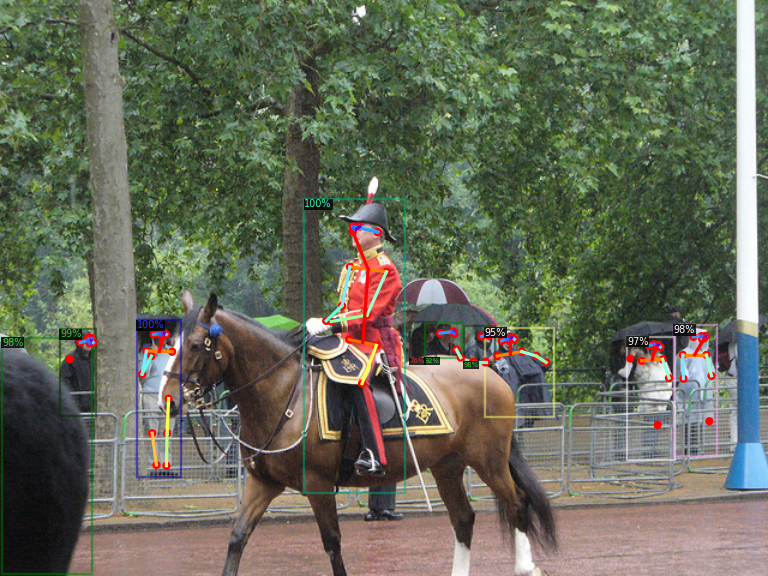

In [ ]:
# Inference with a keypoint detection model
cfg = get_cfg()   # get a fresh new config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [10/15 06:33:37 d2.config.compat]: Config './detectron2_repo/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


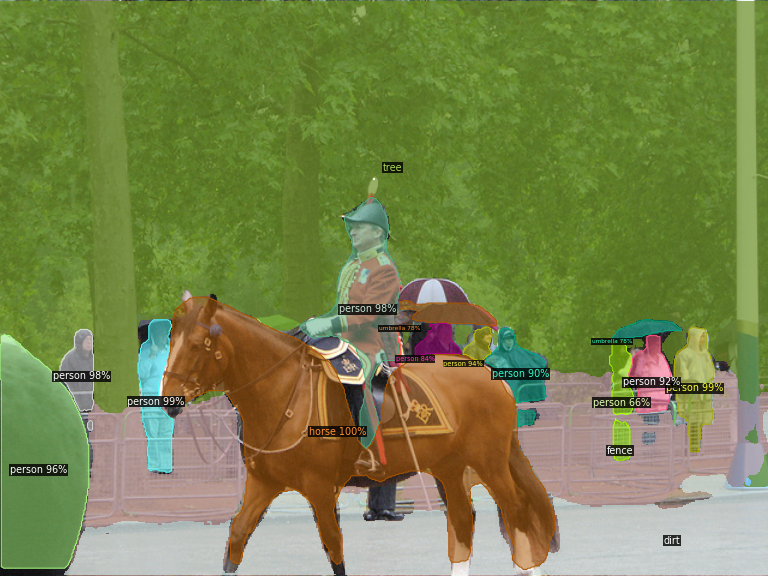

In [ ]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])